In [1]:
from cellpose import models, utils
from skimage import io
import matplotlib.pyplot as plt
import numpy as np
from tqdm.notebook import tqdm
import largestinteriorrectangle as lir
from scipy import ndimage
from cellstitch.pipeline import full_stitch
from monolayer_tracking import preprocessing

# 3d segmentation

## cellstitch

In [2]:
def normalize(img, bounds):
    img=img.astype(np.float32)
    img=(img-bounds[0])/(bounds[1]-bounds[0])
    img=np.clip(img,0,1)
    return img

In [11]:
#membrane=io.imread(r'F:\my_data\raw_data\20240423 halo FUCCI fixed SC zstacks\20240423_SC5.TIF')
membrane=io.imread(r'C:\Users\Andy\Desktop\test_20x.tif')
quantiles=[np.quantile(mem, 0.99) for mem in tqdm(membrane, desc='Calculating quantiles')]
normalization_frame=np.argmax(quantiles)

normalization_bounds=[np.min(membrane[normalization_frame]), np.max(membrane[normalization_frame])]
normalized_membrane=normalize(membrane,normalization_bounds)

flow_threshold=1
diameter=39

xy_res=6.45/20
z_res=6.45/20#1
anisotropy=z_res/xy_res

model = models.Cellpose(model_type='cyto3', gpu=True)
xy_masks=[]
for membrane_slice in tqdm(normalized_membrane, desc='xy'):
    xy_masks.append(model.eval(membrane_slice, diameter=diameter, flow_threshold=flow_threshold, channels = [0,0])[0])
xy_masks = np.array(xy_masks)

xz_masks=[]
for membrane_slice in tqdm(normalized_membrane.transpose(1,0,2), desc='xz'):
    xz_masks.append(model.eval(membrane_slice, diameter=diameter/anisotropy, flow_threshold=flow_threshold, channels = [0,0])[0])
xz_masks = np.array(xz_masks).transpose(1,0,2)

yz_masks=[]
for membrane_slice in tqdm(normalized_membrane.transpose(2,0,1), desc='yz'):
    yz_masks.append(model.eval(membrane_slice, diameter=diameter/anisotropy, flow_threshold=flow_threshold, channels = [0,0])[0])
yz_masks = np.array(yz_masks).transpose(1,2,0)

cellstitch_masks = full_stitch(xy_masks, yz_masks, xz_masks, verbose=True)

Calculating quantiles:   0%|          | 0/93 [00:00<?, ?it/s]

xy:   0%|          | 0/93 [00:00<?, ?it/s]

xz:   0%|          | 0/756 [00:00<?, ?it/s]

yz:   0%|          | 0/624 [00:00<?, ?it/s]

===Stitching frame 9 with frame 7 ...===
===Stitching frame 10 with frame 9 ...===
===Stitching frame 11 with frame 10 ...===
===Stitching frame 12 with frame 11 ...===
===Stitching frame 13 with frame 12 ...===
===Stitching frame 14 with frame 13 ...===
===Stitching frame 15 with frame 14 ...===
===Stitching frame 16 with frame 15 ...===
===Stitching frame 17 with frame 16 ...===
===Stitching frame 18 with frame 17 ...===
===Stitching frame 19 with frame 18 ...===
===Stitching frame 20 with frame 19 ...===
===Stitching frame 21 with frame 20 ...===
===Stitching frame 22 with frame 21 ...===
===Stitching frame 23 with frame 22 ...===
===Stitching frame 24 with frame 23 ...===
===Stitching frame 25 with frame 24 ...===
===Stitching frame 26 with frame 25 ...===
===Stitching frame 27 with frame 26 ...===
===Stitching frame 28 with frame 27 ...===
===Stitching frame 29 with frame 28 ...===
===Stitching frame 30 with frame 29 ...===
===Stitching frame 31 with frame 30 ...===
===Stitching f

In [10]:
cellstitch_masks2=cellstitch_masks.copy()

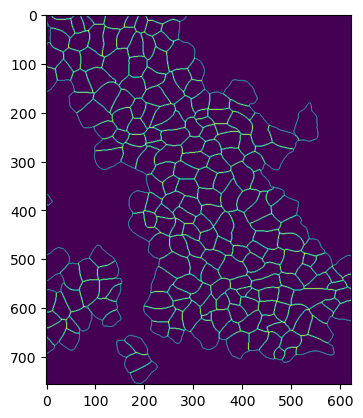

In [14]:
outlines=utils.masks_to_outlines(cellstitch_masks[29])
plt.imshow(outlines)

In [15]:
io.imsave(r'C:\Users\Andy\Desktop\test_20x.ome.tif', cellstitch_masks[:,np.newaxis])

C:\Users\Andy\AppData\Local\Temp\ipykernel_10960\3064050683.py:1: UserWarning: C:\Users\Andy\Desktop\test_20x.ome.tif is a low contrast image
  io.imsave(r'C:\Users\Andy\Desktop\test_20x.ome.tif', cellstitch_masks[:,np.newaxis])


In [337]:
cellstitch_masks[:,np.newaxis].shape

(101, 1, 1584, 1120)

In [21]:
io.imsave(r'C:\Users\Andy\Desktop\20240417/cellstitch.tif', cellstitch_masks[:,np.newaxis])

C:\Users\Andy\AppData\Local\Temp\ipykernel_33480\2025996197.py:1: UserWarning: C:\Users\Andy\Desktop\20240417/cellstitch.tif is a low contrast image
  io.imsave(r'C:\Users\Andy\Desktop\20240417/cellstitch.tif', cellstitch_masks[:,np.newaxis])


In [115]:
root_dir=r'F:\my_data\Data\20240415 halo FUCCI col_glass ME adhered_suspended/'
output_dir=r'F:\my_data\Segmentation\20240415 halo FUCCI col_glass ME adhered_suspended\segmented\adhered/'

for region in tqdm(['region3', 'region4'], desc='regions'):
    img=io.imread(root_dir+f'{region}.tif')
    membrane=img[:,2]

    # normalize membranes with zeros masked
    quantiles=[np.quantile(mem, 0.99) for mem in tqdm(membrane, desc='Calculating quantiles')]
    normalization_frame=np.argmax(quantiles)
    is_img=membrane[normalization_frame]!=0
    is_img=ndimage.binary_fill_holes(is_img)
    bounds=lir.lir(is_img)
    bounds[2:]+=bounds[:2] # width/height to coordinates
    print(f'cropping bounds: {bounds}')

    membrane=membrane[:, bounds[1]:bounds[3],bounds[0]:bounds[2]]

    normalization_bounds=[np.min(membrane[normalization_frame]), np.max(membrane[normalization_frame])]
    normalized_membrane=normalize(membrane,normalization_bounds)

    flow_threshold=1
    model = models.Cellpose(model_type='cyto3', gpu=True)
    xy_masks=[]
    for membrane_slice in tqdm(normalized_membrane, desc='xy'):
        xy_masks.append(model.eval(membrane_slice, diameter=80, flow_threshold=flow_threshold, channels = [0,0])[0])
    xy_masks = np.array(xy_masks)

    xz_masks=[]
    for membrane_slice in tqdm(normalized_membrane.transpose(1,0,2), desc='xz'):
        xz_masks.append(model.eval(membrane_slice, diameter=80, flow_threshold=flow_threshold, channels = [0,0])[0])
    xz_masks = np.array(xz_masks).transpose(1,0,2)

    yz_masks=[]
    for membrane_slice in tqdm(normalized_membrane.transpose(2,0,1), desc='yz'):
        yz_masks.append(model.eval(membrane_slice, diameter=80, flow_threshold=flow_threshold, channels = [0,0])[0])
    yz_masks = np.array(yz_masks).transpose(1,2,0)

    cellstitch_masks = full_stitch(xy_masks, yz_masks, xz_masks, verbose=True)

    masks_3d=np.zeros_like(img[:,2], dtype=np.uint16)
    masks_3d[:, bounds[1]:bounds[3],bounds[0]:bounds[2]]=cellstitch_masks

    np.save(output_dir+f'{region}.npy', masks_3d)

regions:   0%|          | 0/2 [00:00<?, ?it/s]

Calculating quantiles:   0%|          | 0/33 [00:00<?, ?it/s]

cropping bounds: [ 191   87 4651 7908]


xy:   0%|          | 0/33 [00:00<?, ?it/s]

xz:   0%|          | 0/7821 [00:00<?, ?it/s]

yz:   0%|          | 0/4460 [00:00<?, ?it/s]

===Stitching frame 8 with frame 7 ...===
===Stitching frame 9 with frame 8 ...===
===Stitching frame 10 with frame 9 ...===
===Stitching frame 11 with frame 10 ...===
===Stitching frame 12 with frame 11 ...===
===Stitching frame 13 with frame 12 ...===
===Stitching frame 14 with frame 13 ...===
===Stitching frame 15 with frame 14 ...===
===Stitching frame 16 with frame 15 ...===
===Stitching frame 17 with frame 16 ...===
===Stitching frame 18 with frame 17 ...===
===Stitching frame 19 with frame 18 ...===
===Stitching frame 20 with frame 19 ...===
===Stitching frame 21 with frame 20 ...===
===Stitching frame 22 with frame 21 ...===
===Stitching frame 23 with frame 22 ...===
===Stitching frame 24 with frame 23 ...===
===Stitching frame 25 with frame 24 ...===
===Stitching frame 26 with frame 25 ...===
===Stitching frame 27 with frame 26 ...===
===Stitching frame 28 with frame 27 ...===
===Stitching frame 29 with frame 28 ...===
===Stitching frame 30 with frame 29 ...===
===Stitching fra

Calculating quantiles:   0%|          | 0/33 [00:00<?, ?it/s]

cropping bounds: [ 157  133 6472 7917]


xy:   0%|          | 0/33 [00:00<?, ?it/s]

xz:   0%|          | 0/7784 [00:00<?, ?it/s]

yz:   0%|          | 0/6315 [00:00<?, ?it/s]

===Stitching frame 7 with frame 6 ...===
===Stitching frame 8 with frame 7 ...===
===Stitching frame 9 with frame 8 ...===
===Stitching frame 10 with frame 9 ...===


c:\Users\Andy\anaconda3\envs\cellpose\Lib\site-packages\ot\lp\__init__.py:354: UserWarning: numItermax reached before optimality. Try to increase numItermax.
  result_code_string = check_result(result_code)


===Stitching frame 11 with frame 10 ...===
===Stitching frame 12 with frame 11 ...===
===Stitching frame 13 with frame 12 ...===
===Stitching frame 14 with frame 13 ...===
===Stitching frame 15 with frame 14 ...===
===Stitching frame 16 with frame 15 ...===
===Stitching frame 17 with frame 16 ...===
===Stitching frame 18 with frame 17 ...===
===Stitching frame 19 with frame 18 ...===
===Stitching frame 20 with frame 19 ...===
===Stitching frame 21 with frame 20 ...===
===Stitching frame 22 with frame 21 ...===
===Stitching frame 23 with frame 22 ...===
===Stitching frame 24 with frame 23 ...===
===Stitching frame 25 with frame 24 ...===
===Stitching frame 26 with frame 25 ...===
===Stitching frame 27 with frame 26 ...===
===Stitching frame 28 with frame 27 ...===
===Stitching frame 29 with frame 28 ...===
===Stitching frame 30 with frame 29 ...===
===Stitching frame 31 with frame 30 ...===
===Stitching frame 32 with frame 31 ...===


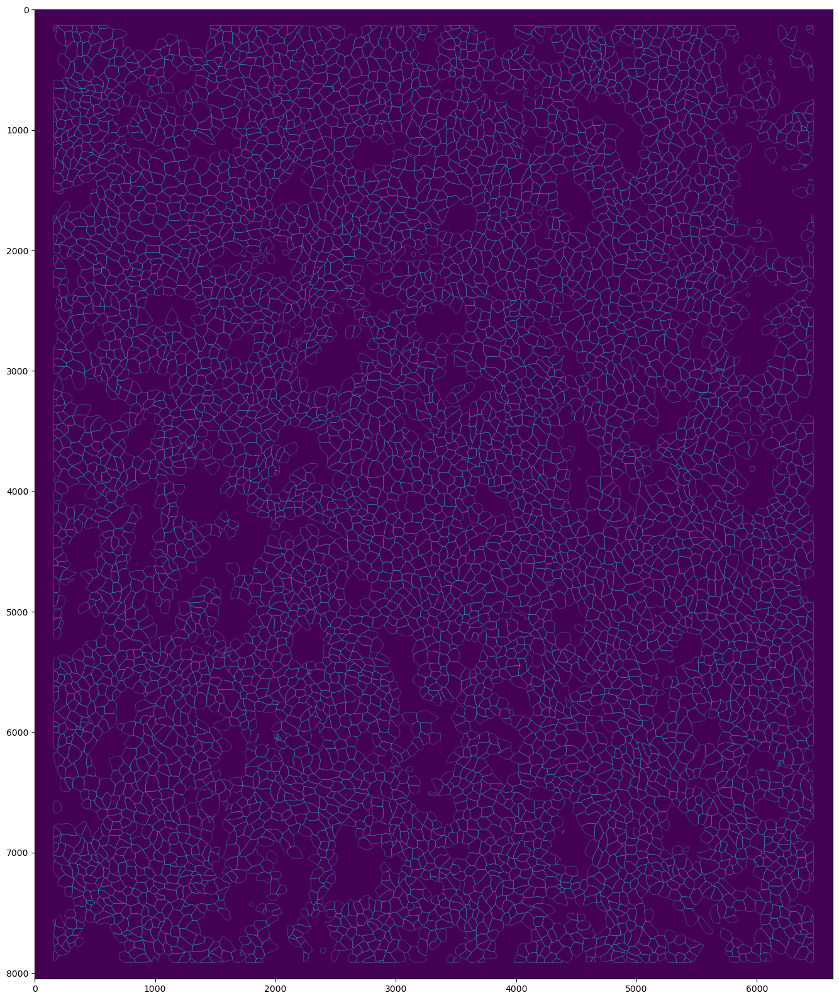

In [118]:
plt.figure(figsize=(20,20))
plt.imshow(utils.masks_to_outlines(masks_3d[13]))

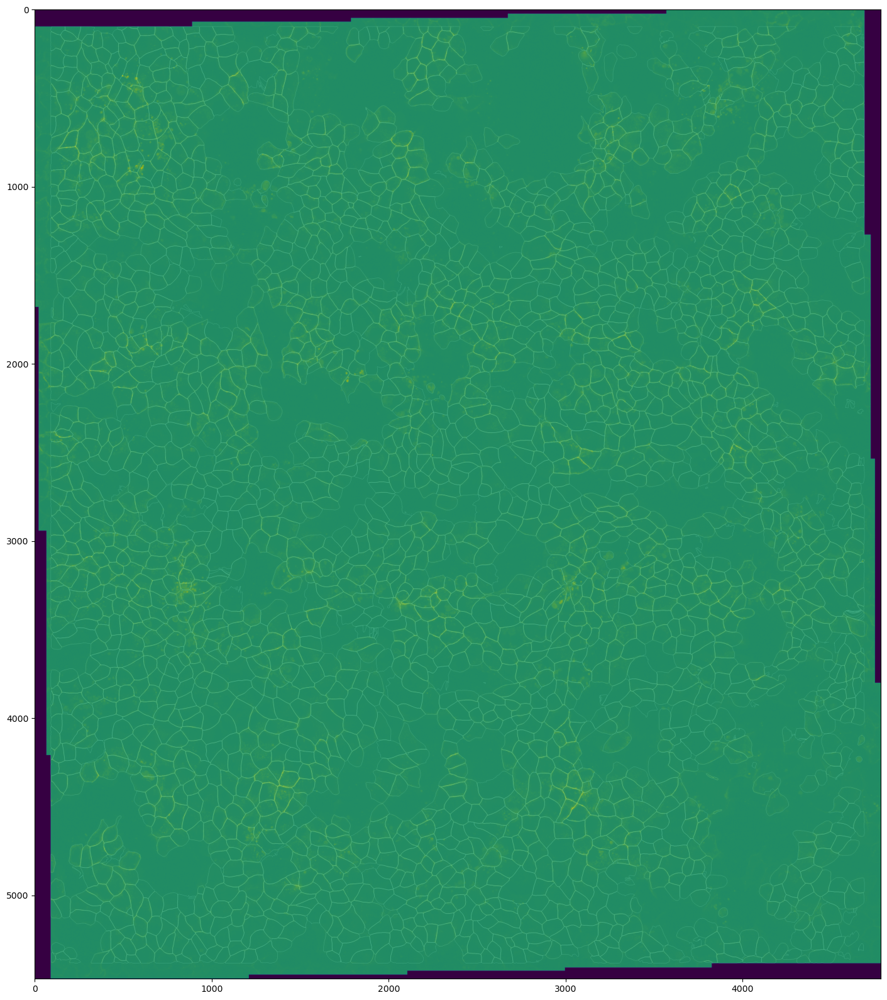

In [83]:
from cellpose import utils

plt.figure(figsize=(20,20))
outlines=utils.masks_to_outlines(masks_3d[13])
plt.imshow(outlines, cmap='gray')
plt.imshow(img[13,2], alpha=0.8, cmap='viridis')

(33, 3, 5471, 4782)

In [44]:
masks_3d=np.zeros_like(img[:,2], dtype=np.uint16)
masks_3d[:, bounds[1]:bounds[3],bounds[0]:bounds[2]]=cellstitch_masks

In [49]:
np.sum(masks_3d==5)*(6.45/40)**2

1822.9955484375002

In [72]:
cell, volume=np.array(np.unique(masks_3d, return_counts=True))[:,1:]

(array([238., 253., 213., 137., 110.,  93.,  75.,  85.,  77.,  81.,  83.,
        100.,  97.,  97., 120., 152., 130., 129., 121., 134., 128., 124.,
        115.,  83.,  99.,  80.,  55.,  56.,  53.,  40.,  34.,  37.,  33.,
         28.,  22.,  21.,  18.,  16.,  16.,   6.,   2.,   6.,   7.,   6.,
          7.,   5.,   1.,   6.,   8.,   1.,   0.,   2.,   3.,   1.,   2.,
          1.,   0.,   1.,   0.,   1.,   0.,   0.,   0.,   0.,   1.,   2.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          1.]),
 array([1.19607188e+00, 6.76464450e+01, 1.34096818e+02, 2.00547191e+02,
        2.66997565e+02, 3.33447938e+02, 3.99898311e+02, 4.66348684e+02,
        5.32799057e+02, 5.99249430e+02, 6.65699804e+02, 7.32150177e+02,
        7.98600550e+02, 8.65050923e+02, 9.31501296e+02, 9.97951669e+02,
        1.06440204e+03, 1.1308

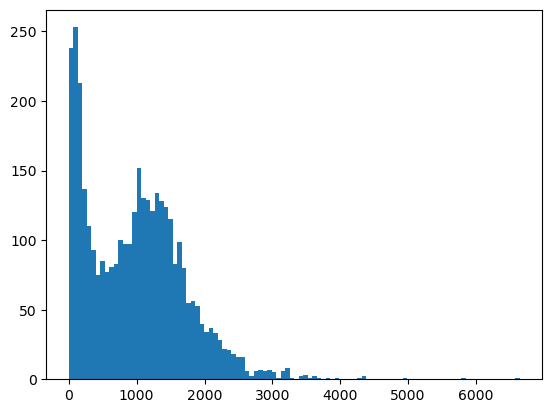

In [74]:
plt.hist(volume*(6.45/40)**2, bins=100)

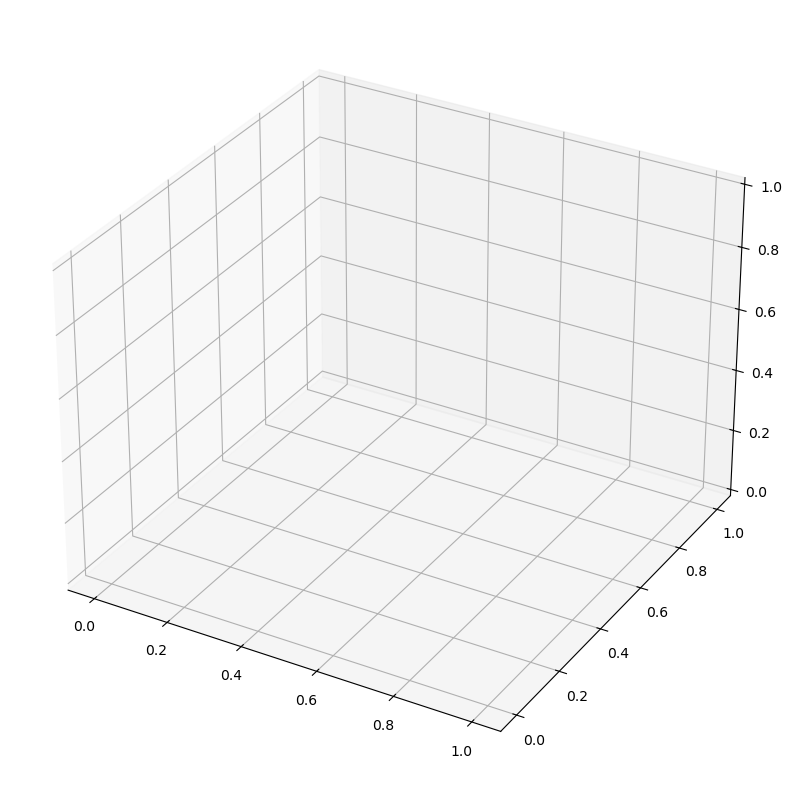

In [70]:
mask5=masks_3d==12
# 3d plot
fig=plt.figure(figsize=(10,10))
ax=fig.add_subplot(111, projection='3d')

# outline using binary erosion
mask5_eroded=ndimage.binary_erosion(mask5, iterations=1)
mask5_outline=mask5.copy()
mask5_outline[mask5_eroded]=0

z,x,y=np.where(mask5_outline)
x,y=x*6.45/40, y*6.45/40
ax.scatter(x,y,z, alpha=0.1)

In [45]:
np.save('F:/my_data/Segmentation/20240415 halo FUCCI col_glass ME adhered_suspended/segmented/adhered/region2.npy', masks_3d)

In [1]:
import numpy as np
from skimage import io

masks_3d=np.load('F:/my_data/Segmentation/20240415 halo FUCCI col_glass ME adhered_suspended/segmented/adhered/region1.npy')

In [8]:
import matplotlib.pyplot as plt

In [21]:
test_export

array([[[[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]]],


       [[[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]]],


       [[[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]]],


       ...,


       [[[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]]],


       [[[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 

In [22]:
test_export=masks_3d[:, 300:500, 600:800]

test_export=test_export[:, np.newaxis]

io.imsave('F:/my_data/Segmentation/20240415 halo FUCCI col_glass ME adhered_suspended/segmented/adhered/test2.ome.tif', test_export)

C:\Users\Andy\AppData\Local\Temp\ipykernel_24532\3753271791.py:5: UserWarning: F:/my_data/Segmentation/20240415 halo FUCCI col_glass ME adhered_suspended/segmented/adhered/test2.ome.tif is a low contrast image
  io.imsave('F:/my_data/Segmentation/20240415 halo FUCCI col_glass ME adhered_suspended/segmented/adhered/test2.ome.tif', test_export)


In [24]:
io.imsave('F:/my_data/Segmentation/20240415 halo FUCCI col_glass ME adhered_suspended/segmented/adhered/region1_test.ome.tif', masks_3d[:,np.newaxis,300:500,600:800])

C:\Users\Andy\AppData\Local\Temp\ipykernel_24532\1601787529.py:1: UserWarning: F:/my_data/Segmentation/20240415 halo FUCCI col_glass ME adhered_suspended/segmented/adhered/region1_test.ome.tif is a low contrast image
  io.imsave('F:/my_data/Segmentation/20240415 halo FUCCI col_glass ME adhered_suspended/segmented/adhered/region1_test.ome.tif', masks_3d[:,np.newaxis,300:500,600:800])


In [26]:
io.imsave('F:/my_data/Segmentation/20240415 halo FUCCI col_glass ME adhered_suspended/segmented/adhered/region1.ome.tif', masks_3d[:,np.newaxis])

C:\Users\Andy\AppData\Local\Temp\ipykernel_24532\1426133230.py:1: UserWarning: F:/my_data/Segmentation/20240415 halo FUCCI col_glass ME adhered_suspended/segmented/adhered/region1.ome.tif is a low contrast image
  io.imsave('F:/my_data/Segmentation/20240415 halo FUCCI col_glass ME adhered_suspended/segmented/adhered/region1.ome.tif', masks_3d[:,np.newaxis])


## native cellpose 3d

In [2]:
model=models.Cellpose(gpu=True, model_type='cyto3')
#img=io.imread('C:/Users/Andy/Desktop/test_composite.tif')
img=io.imread(r'C:\Users\Andy\Desktop\20240417\C3-test.tif')

In [3]:
img.shape

(33, 1760, 1976)

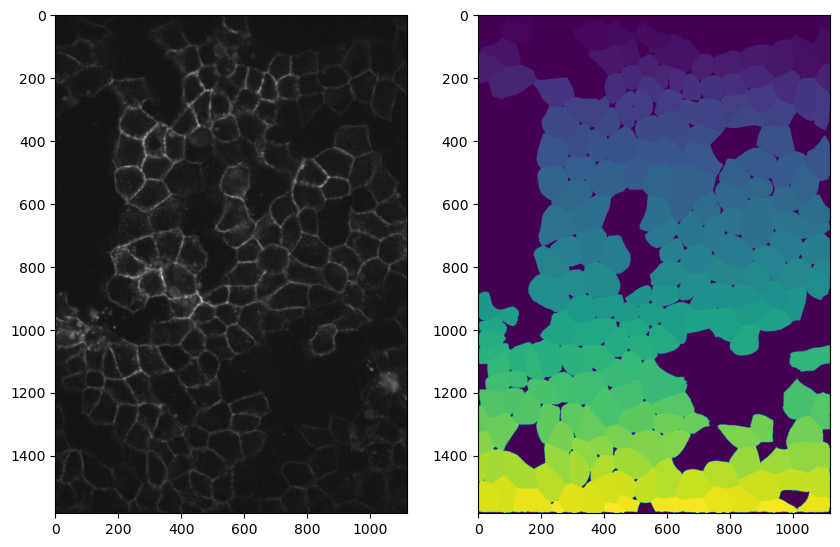

In [21]:
fig, axes=plt.subplots(1,2, figsize=(10,10))
axes[0].imshow(img[13,2], cmap='gray')
masks=model.eval(img[13,2], diameter=90)[0]
axes[1].imshow(masks)

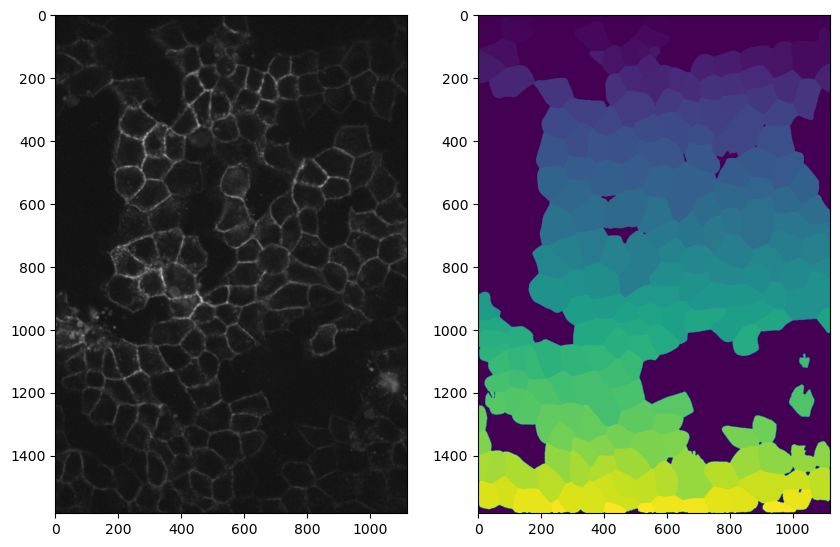

In [5]:
model = models.Cellpose(gpu=True, model_type='cyto3')
fig, axes=plt.subplots(1,2, figsize=(10,10))
axes[0].imshow(img[13,2], cmap='gray')
masks, flows, styles, diams=model.eval(img[13,2], diameter=None)
axes[1].imshow(masks)
plt.show()

In [4]:
masks, flows, styles, diams=model.eval(img, diameter=83, channels=[2,0], anisotropy=6.201550387596899, do_3D=True, flow_threshold=1)

In [8]:
masks.dtype

dtype('uint16')

In [9]:
io.imsave(r'C:\Users\Andy\Desktop\20240417\test_masks.tif', masks)

C:\Users\Andy\AppData\Local\Temp\ipykernel_33480\3270706525.py:1: UserWarning: C:\Users\Andy\Desktop\20240417\test_masks.tif is a low contrast image
  io.imsave(r'C:\Users\Andy\Desktop\20240417\test_masks.tif', masks)


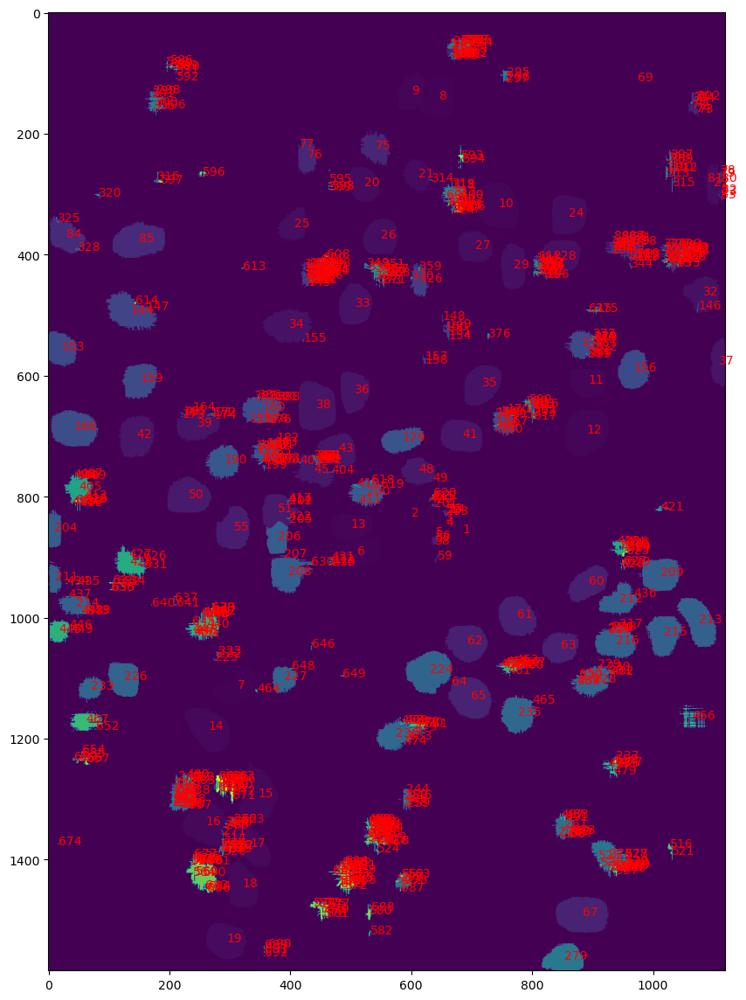

In [51]:
plt.figure(figsize=(10,15))
n=13

slice_masks=masks[n]
plt.imshow(slice_masks)
# number each mask
for i in np.unique(slice_masks)[1:]:
    y,x=np.where(slice_masks==i)
    plt.text(x.mean(), y.mean(), str(i), color='red')

# FUCCI measurements

## load data

In [273]:
class Fucci_3D:
    def __init__(self, img_path, mask_path, verbose=True, remove_edge_masks=True, scale=0.16125, preprocess_FUCCI=True):
        self.img_path=img_path
        self.mask_path=mask_path
        self.verbose=verbose
        self.scale=scale

        if self.verbose:
            print('loading images')
        img=io.imread(self.img_path)
        self.masks=np.load(self.mask_path)
        gem, pip, membrane=img.transpose(3,0,1,2)

        if self.verbose:
            print('getting bounds and cropping images')
        self.bounds=self.get_bounds(membrane[0])
        self.membrane=self.crop_to_bounds(membrane, self.bounds)
        self.gem=self.crop_to_bounds(gem, self.bounds)
        self.pip=self.crop_to_bounds(pip, self.bounds)
        self.masks=self.crop_to_bounds(self.masks, self.bounds)

        if remove_edge_masks:
            if self.verbose:
                print('removing edge masks')
            self.masks=utils.remove_edge_masks(self.masks)

        if preprocess_FUCCI:
            self.gem=self._blur_normalize(self.gem)
            self.pip=self._blur_normalize(self.pip)

    def get_bounds(self, img):
        bounds=lir.lir(img!=0)
        bounds[2:]+=bounds[:2]
        return bounds
    
    def crop_to_bounds(self, img, bounds):
        return img[:, bounds[1]:bounds[3],bounds[0]:bounds[2]]

    def _blur_normalize(self, img, quantile=(0.01,0.99), sigma=5, truncate=3, **kwargs):
        if self.verbose:
            print('blurring and normalizing FUCCI images')
        img=ndimage.gaussian_filter(img, sigma=sigma, truncate=truncate, output=np.float32)
        img=preprocessing.normalize(img, quantile=quantile)
        return img

    def measure_FUCCI(self, red_threshold=0.4, green_threshold=0.25, percent_threshold=0.15):
        red_thresholded=self.gem>red_threshold
        green_thresholded=self.pip>green_threshold
        orange_thresholded=red_thresholded & green_thresholded
        
        red_percentages=preprocessing.fluorescent_percentages(self.masks, red_thresholded)
        green_percentages=preprocessing.fluorescent_percentages(self.masks, green_thresholded)
        orange_percentages=preprocessing.fluorescent_percentages(self.masks, orange_thresholded)

        fluor_percentages=np.stack([green_percentages, red_percentages, orange_percentages], axis=0)
        fluor_nuclei=np.array([*(fluor_percentages[:2]>percent_threshold), fluor_percentages[2]>1.5*percent_threshold]).T
        fluor_nuclei[fluor_nuclei[:,2], :2]=0 # wherever cells are orange, turn off red and green

        red_or_green=fluor_nuclei[:,0]&fluor_nuclei[:,1]
        fluor_nuclei[red_or_green, np.argmin(fluor_percentages[:2, red_or_green], axis=0)]=0 # if not orange, pick red or green based on which has a higher percentage
        cc_stage_number=np.argmax(fluor_nuclei, axis=1)+1 # G1->1, S->2, G2->3
        cc_stage_number[np.sum(fluor_nuclei, axis=1)==0]=0 # no signal->0
        self.cc_stages=cc_stage_number

    def get_volumes(self, **kwargs):
        if not hasattr(self, 'cc_stages'):
            if self.verbose:
                print('measuring FUCCI')
            self.measure_FUCCI(**kwargs)
        volumes=np.unique(self.masks, return_counts=True)[1][1:]*self.scale**2
        self.volumes=[volumes[self.cc_stages==0], volumes[self.cc_stages==1], volumes[self.cc_stages==2], volumes[self.cc_stages==3]]
        return self.volumes

In [267]:
img_dir=r'F:\my_data\Data\20240415 halo FUCCI col_glass ME adhered_suspended/'
seg_dir=r'F:\my_data\Segmentation\20240415 halo FUCCI col_glass ME adhered_suspended\segmented\adhered/'

In [274]:
region1=Fucci_3D(img_dir+'region1.tif', seg_dir+'region1.npy')

loading images
getting bounds and cropping images
removing edge masks
blurring and normalizing FUCCI images
blurring and normalizing FUCCI images


In [278]:
region1.volumes=region1.get_volumes()

In [283]:
region2=Fucci_3D(img_dir+'region2.tif', seg_dir+'region2.npy')
region3=Fucci_3D(img_dir+'region3.tif', seg_dir+'region3.npy')
region4=Fucci_3D(img_dir+'region4.tif', seg_dir+'region4.npy')

loading images


getting bounds and cropping images
removing edge masks
blurring and normalizing FUCCI images
blurring and normalizing FUCCI images
loading images
getting bounds and cropping images
removing edge masks
blurring and normalizing FUCCI images
blurring and normalizing FUCCI images
loading images
getting bounds and cropping images
removing edge masks
blurring and normalizing FUCCI images
blurring and normalizing FUCCI images


In [294]:
region2.volumes=region2.get_volumes()
region2.volumes=[v*0.16125**2 for v in region2.volumes]

In [295]:
region3.volumes=region3.get_volumes()
region3.volumes=[v*0.16125**2 for v in region3.volumes]

measuring FUCCI


In [296]:
region4.volumes=region4.get_volumes()
region4.volumes=[v*0.16125**2 for v in region4.volumes]

measuring FUCCI


In [297]:
volumes=[np.concatenate([v1,v2,v3,v4]) for v1, v2, v3, v4 in zip(region1.volumes, region2.volumes, region3.volumes, region4.volumes)]

(array([0.00000000e+00, 0.00000000e+00, 1.77777778e-04, 4.19047619e-04,
        5.20634921e-04, 4.69841270e-04, 3.80952381e-04, 5.58730159e-04,
        4.44444444e-04, 6.60317460e-04, 4.69841270e-04, 3.93650794e-04,
        4.19047619e-04, 3.80952381e-04, 2.92063492e-04, 2.28571429e-04,
        1.39682540e-04, 1.52380952e-04, 1.26984127e-04, 1.01587302e-04,
        7.61904762e-05, 1.01587302e-04, 1.26984127e-05, 0.00000000e+00,
        6.34920635e-05, 2.53968254e-05, 2.53968254e-05, 1.26984127e-05,
        0.00000000e+00, 1.26984127e-05, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00]),
 array([   0.,  150.,  300.,  450.,  600.,  750.,  900., 1050., 1200.,
        1350., 1500., 1650., 1800., 1950., 2100., 2250., 2400., 2550.,
        2700., 2850., 3000., 3150., 3300., 3450., 3600., 3750., 3900.,
        4050., 4200., 4350., 4500., 4650., 4800., 4950., 5100., 5

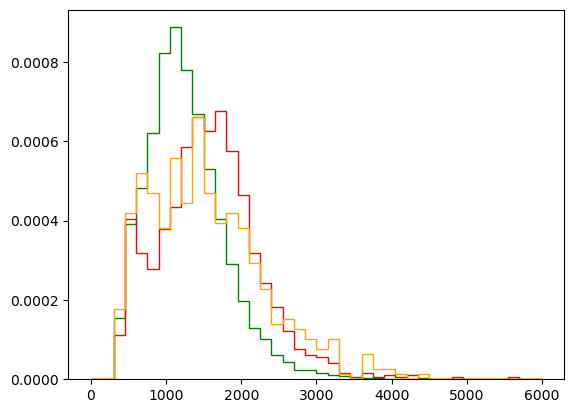

In [304]:
filter=400
plt.hist(volumes[1][volumes[1]>filter], bins=40, range=(0,6000), color='green', density=True, histtype='step')
plt.hist(volumes[2][volumes[2]>filter], bins=40, range=(0,6000), color='red', density=True, histtype='step')
plt.hist(volumes[3][volumes[3]>filter], bins=40, range=(0,6000), color='orange', density=True, histtype='step')

In [306]:
import pandas as pd
vol_0412_ME=pd.read_pickle(r'F:\my_data\Segmentation\20240412 FUCCI_halo_40x suspension ME\volumes\ME.pkl')
vol_0415_ME2=pd.read_pickle(r'F:\my_data\Segmentation\20240415 halo FUCCI col_glass ME adhered_suspended\volumes\suspension2.pkl')

In [320]:
help(pd.to_pickle)

Help on function to_pickle in module pandas.io.pickle:

to_pickle(obj: 'Any', filepath_or_buffer: 'FilePath | WriteBuffer[bytes]', compression: 'CompressionOptions' = 'infer', protocol: 'int' = 5, storage_options: 'StorageOptions | None' = None) -> 'None'
    Pickle (serialize) object to file.
    
    Parameters
    ----------
    obj : any object
        Any python object.
    filepath_or_buffer : str, path object, or file-like object
        String, path object (implementing ``os.PathLike[str]``), or file-like
        object implementing a binary ``write()`` function.
        Also accepts URL. URL has to be of S3 or GCS.
    compression : str or dict, default 'infer'
        For on-the-fly compression of the output data. If 'infer' and 'filepath_or_buffer' is
        path-like, then detect compression from the following extensions: '.gz',
        '.bz2', '.zip', '.xz', '.zst', '.tar', '.tar.gz', '.tar.xz' or '.tar.bz2'
        (otherwise no compression).
        Set to ``None`` for 

In [321]:
pd.to_pickle(volumes, r'F:\my_data\Segmentation\20240415 halo FUCCI col_glass ME adhered_suspended\volumes/adhered.pkl')

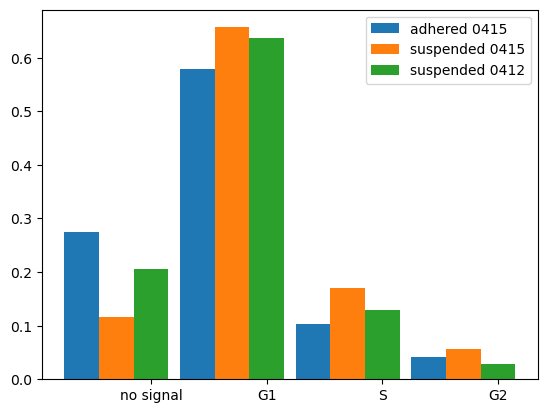

In [325]:
plt.bar(np.arange(4)-0.3, [len(v)/len(np.concatenate(volumes)) for v in volumes], width=0.3, label='adhered 0415')
plt.bar(np.arange(4), [len(v)/len(np.concatenate(vol_0415_ME2)) for v in vol_0415_ME2], width=0.3, label='suspended 0415')
plt.bar(np.arange(4)+0.3, [len(v)/len(np.concatenate(vol_0412_ME)) for v in vol_0412_ME], width=0.3, tick_label=['no signal', 'G1', 'S', 'G2'], label='suspended 0412')

plt.legend()

(array([6.70081601e-06, 1.38979888e-05, 2.50660154e-05, 3.00295829e-05,
        4.88911390e-05, 7.84243652e-05, 1.57593265e-04, 2.87638732e-04,
        4.82210574e-04, 6.55190899e-04, 7.17731848e-04, 7.48505966e-04,
        7.55206782e-04, 7.06563822e-04, 6.70329779e-04, 5.91657236e-04,
        5.37057994e-04, 4.42005678e-04, 3.60603173e-04, 2.66543570e-04,
        2.09214367e-04, 1.49155201e-04, 1.02994024e-04, 7.64389382e-05,
        5.11247444e-05, 3.54895070e-05, 2.82923343e-05, 1.88615562e-05,
        1.29052753e-05, 1.16643834e-05, 8.68624298e-06, 8.18988624e-06,
        5.70810253e-06, 5.21174579e-06, 4.96356742e-06, 1.98542697e-06,
        3.97085393e-06, 3.47449719e-06, 1.98542697e-06, 1.48907022e-06,
        9.92713483e-07, 7.44535112e-07, 1.24089185e-06, 1.48907022e-06,
        1.24089185e-06, 2.48178371e-07, 9.92713483e-07, 1.24089185e-06,
        7.44535112e-07, 7.44535112e-07]),
 array([   0.,  120.,  240.,  360.,  480.,  600.,  720.,  840.,  960.,
        1080., 1200., 1

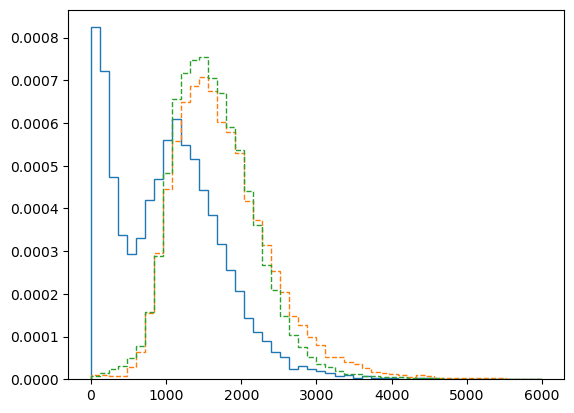

In [317]:
filter=0

plt.hist(np.concatenate(volumes[1:])[np.concatenate(volumes[1:])>filter], range=(0,6000), bins=50, density=True, histtype='step')
plt.hist(np.concatenate(vol_0412_ME[1:]), range=(0,6000), bins=50, density=True, histtype='step', linestyle='--')
plt.hist(np.concatenate(vol_0415_ME2[1:]), range=(0,6000), bins=50, density=True, histtype='step', linestyle='--')

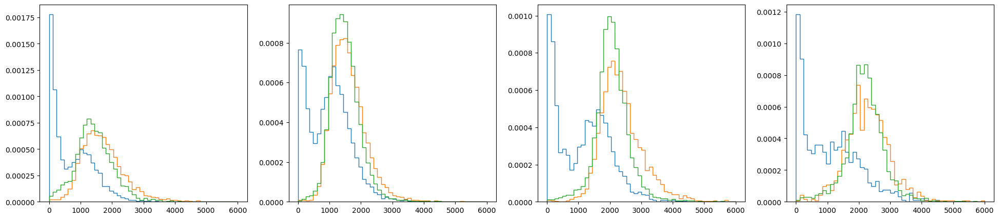

In [319]:
fig, axes=plt.subplots(1,4,figsize=(24,5))

filtered_volumes=[v[v>0] for v in volumes]
for dataset in [filtered_volumes, vol_0412_ME, vol_0415_ME2]:
    for i, v in enumerate(dataset):
        axes[i].hist(v, bins=50, range=(0,6000), density=True, histtype='step')

## select thresholds

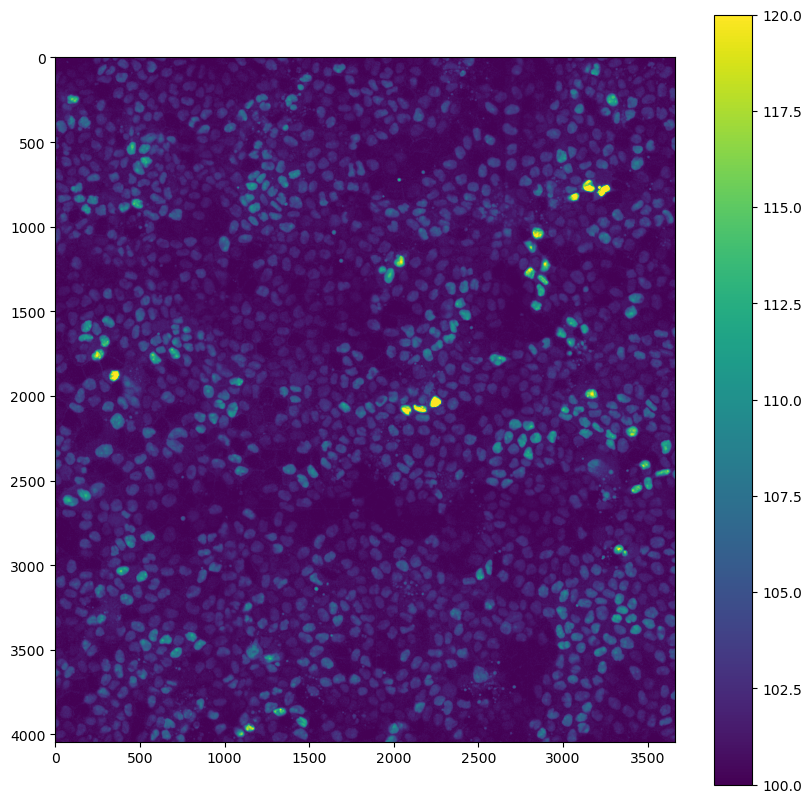

In [90]:
plt.figure(figsize=(10,10))
plt.imshow(pip[13], vmin=100, vmax=120)
plt.colorbar()

In [142]:
gem_blurred=ndimage.gaussian_filter(gem, sigma=5, truncate=3, output=np.float32)
pip_blurred=ndimage.gaussian_filter(pip, sigma=5, truncate=3, output=np.float32)

In [143]:
gem_normalized=preprocessing.normalize(gem_blurred)
pip_normalized=preprocessing.normalize(pip_blurred)

In [158]:
red_thresholded=gem_normalized>0.4
green_thresholded=pip_normalized>0.25
orange_thresholded=red_thresholded&green_thresholded

In [154]:
red_percentages=preprocessing.fluorescent_percentages(masks, red_thresholded)
green_percentages=preprocessing.fluorescent_percentages(masks, green_thresholded)
orange_percentages=preprocessing.fluorescent_percentages(masks, orange_thresholded)

  0%|          | 0/1587 [00:00<?, ?it/s]

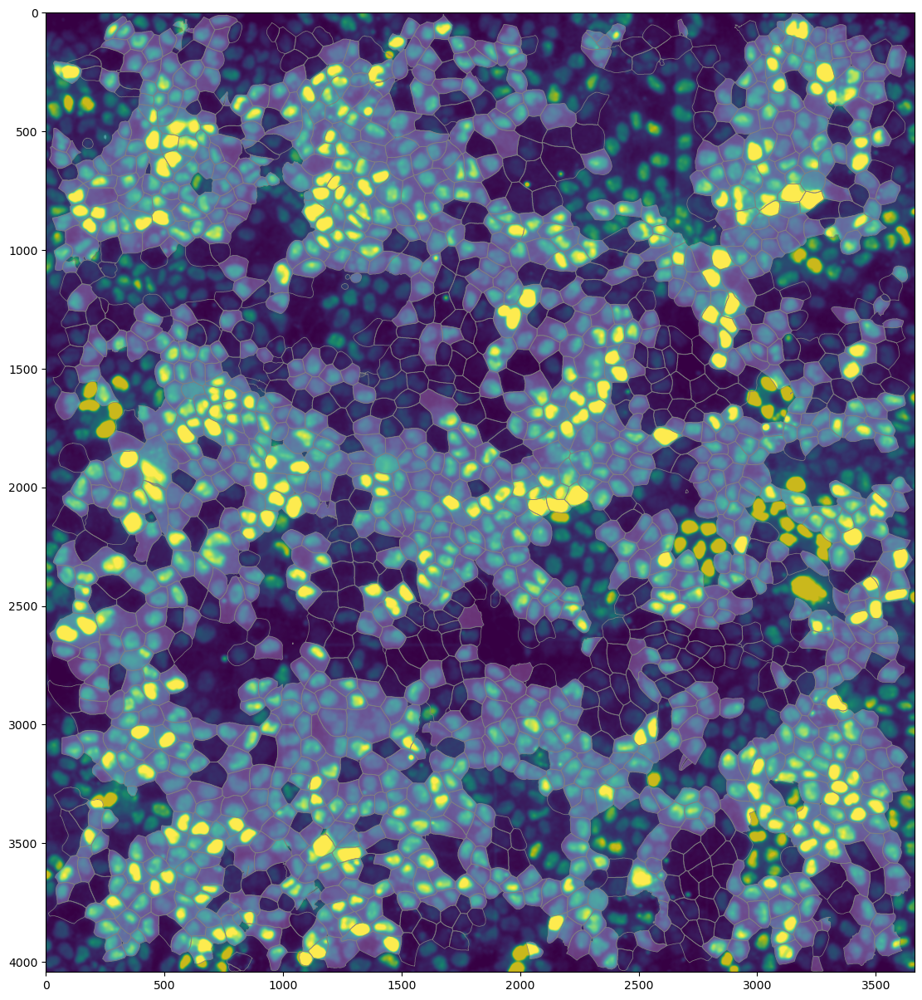

In [213]:
plt.figure(figsize=(15,15))
plt.imshow(pip_normalized[13])

for n, o in enumerate(tqdm(outlines)):
    plt.plot(o[:,0], o[:,1], label=n, linewidth=0.5, color='gray')

red_cells=np.where(green_percentages>0.15)[0]
plt.imshow(np.isin(masks[13], red_cells+1), cmap='gray', alpha=0.2)
#plt.scatter(centroids[:,1], centroids[:,0], color='red', s=1)

In [219]:
percent_threshold=0.15
fluor_percentages=np.stack([green_percentages, red_percentages, orange_percentages], axis=0)
fluor_nuclei=np.array([*(fluor_percentages[:2]>percent_threshold), fluor_percentages[2]>1.5*percent_threshold]).T
fluor_nuclei[fluor_nuclei[:,2], :2]=0 # wherever cells are orange, turn off red and green

red_or_green=fluor_nuclei[:,0]&fluor_nuclei[:,1]
fluor_nuclei[red_or_green, np.argmin(fluor_percentages[:2, red_or_green], axis=0)]=0 # if not orange, pick red or green based on which has a higher percentage
cc_stage_number=np.argmax(fluor_nuclei, axis=1)+1 # G1->1, S->2, G2->3
cc_stage_number[np.sum(fluor_nuclei, axis=1)==0]=0 # no signal->0

<BarContainer object of 4 artists>

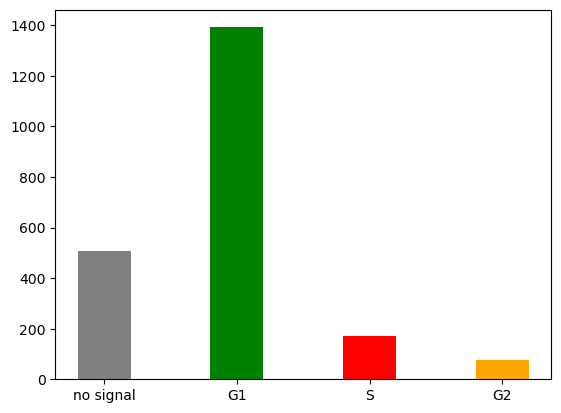

In [227]:
plt.bar(*np.unique(cc_stage_number, return_counts=True), width=0.4, color=['gray', 'green', 'red', 'orange'], tick_label=['no signal', 'G1', 'S', 'G2'])

In [232]:
scale=6.45/40
volumes=np.unique(masks, return_counts=True)[1][1:]*scale**2 # x and y are scaled 6.45/40, z has 1um step

(array([1.08974359e-03, 4.48717949e-04, 5.12820513e-04, 1.92307692e-04,
        3.20512821e-04, 4.48717949e-04, 2.56410256e-04, 3.20512821e-04,
        0.00000000e+00, 1.28205128e-04, 3.20512821e-04, 2.56410256e-04,
        2.56410256e-04, 0.00000000e+00, 2.56410256e-04, 0.00000000e+00,
        1.28205128e-04, 0.00000000e+00, 6.41025641e-05, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00]),
 array([   0.,  200.,  400.,  600.,  800., 1000., 1200., 1400., 1600.,
        1800., 2000., 2200., 2400., 2600., 2800., 3000., 3200., 3400.,
        3600., 3800., 4000., 4200., 4400., 4600., 4800., 5000., 5200.,
        5400., 5600., 5800., 6000.]),
 [<matplotlib.patches.Polygon at 0x2005f537610>])

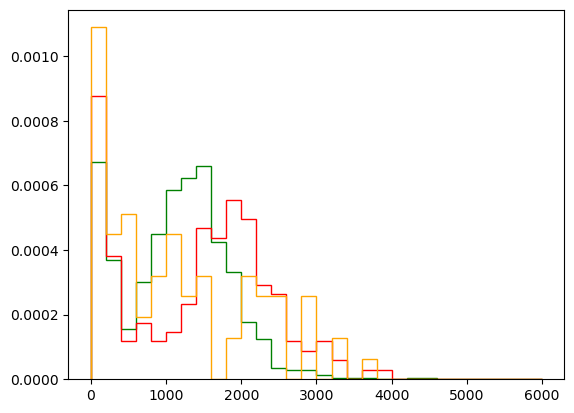

In [239]:
plt.hist(volumes[cc_stage_number==1], range=(0,6000), bins=30, color='green', histtype='step', density=True)
plt.hist(volumes[cc_stage_number==2], range=(0,6000), bins=30, color='red', histtype='step', density=True)
plt.hist(volumes[cc_stage_number==3], range=(0,6000), bins=30, color='orange', histtype='step', density=True)

In [247]:
NS_volumes=volumes[cc_stage_number==0]
G1_volumes=volumes[cc_stage_number==1]
S_volumes=volumes[cc_stage_number==2]
G2_volumes=volumes[cc_stage_number==3]

(array([0.00000000e+00, 0.00000000e+00, 2.14341387e-04, 3.62431800e-04,
        5.22213562e-04, 6.81995323e-04, 7.20966485e-04, 7.98908807e-04,
        5.18316446e-04, 4.40374123e-04, 2.76695246e-04, 1.90958691e-04,
        8.96336711e-05, 4.67653936e-05, 5.84567420e-05, 3.11769291e-05,
        1.94855807e-05, 3.89711613e-06, 1.16913484e-05, 3.89711613e-06,
        0.00000000e+00, 3.89711613e-06, 3.89711613e-06, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00]),
 array([   0.,  200.,  400.,  600.,  800., 1000., 1200., 1400., 1600.,
        1800., 2000., 2200., 2400., 2600., 2800., 3000., 3200., 3400.,
        3600., 3800., 4000., 4200., 4400., 4600., 4800., 5000., 5200.,
        5400., 5600., 5800., 6000.]),
 [<matplotlib.patches.Polygon at 0x200ec394d50>])

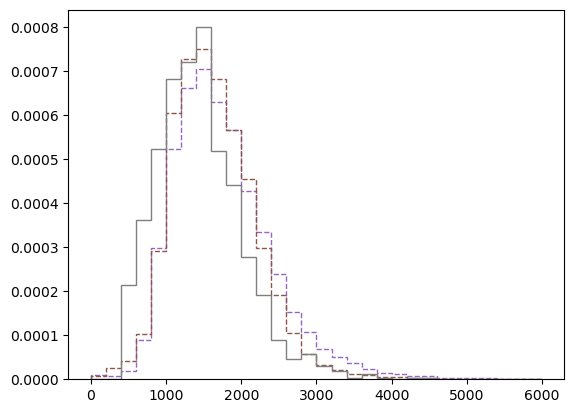

In [265]:
plt.hist(np.concatenate(vol_0412_ME[1:]), bins=30, range=(0,6000), color='C4', histtype='step', linestyle='--', density=True)
plt.hist(np.concatenate(vol_0415_ME2[1:]), bins=30, range=(0,6000), color='C5', histtype='step', linestyle='--', density=True)

filter=400
plt.hist(np.concatenate([G1_volumes[G1_volumes>filter], S_volumes[S_volumes>filter], G2_volumes[G2_volumes>filter]]), bins=30, range=(0,6000), color='C7', histtype='step', density=True)

{'whiskers': [<matplotlib.lines.Line2D at 0x20062d2a510>,
 'caps': [<matplotlib.lines.Line2D at 0x20062d12510>,
 'boxes': [<matplotlib.lines.Line2D at 0x20062d29bd0>,
 'medians': [<matplotlib.lines.Line2D at 0x20062d34890>,
 'fliers': [],
 'means': []}

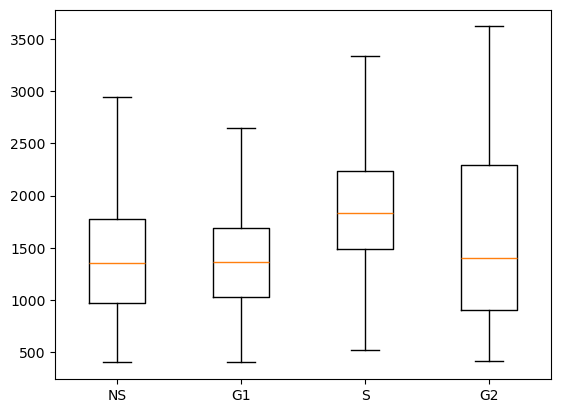

In [249]:
filter=400
plt.boxplot([NS_volumes[NS_volumes>filter], G1_volumes[G1_volumes>filter], S_volumes[S_volumes>filter], G2_volumes[G2_volumes>filter]], labels=['NS','G1', 'S', 'G2'], showfliers=False)

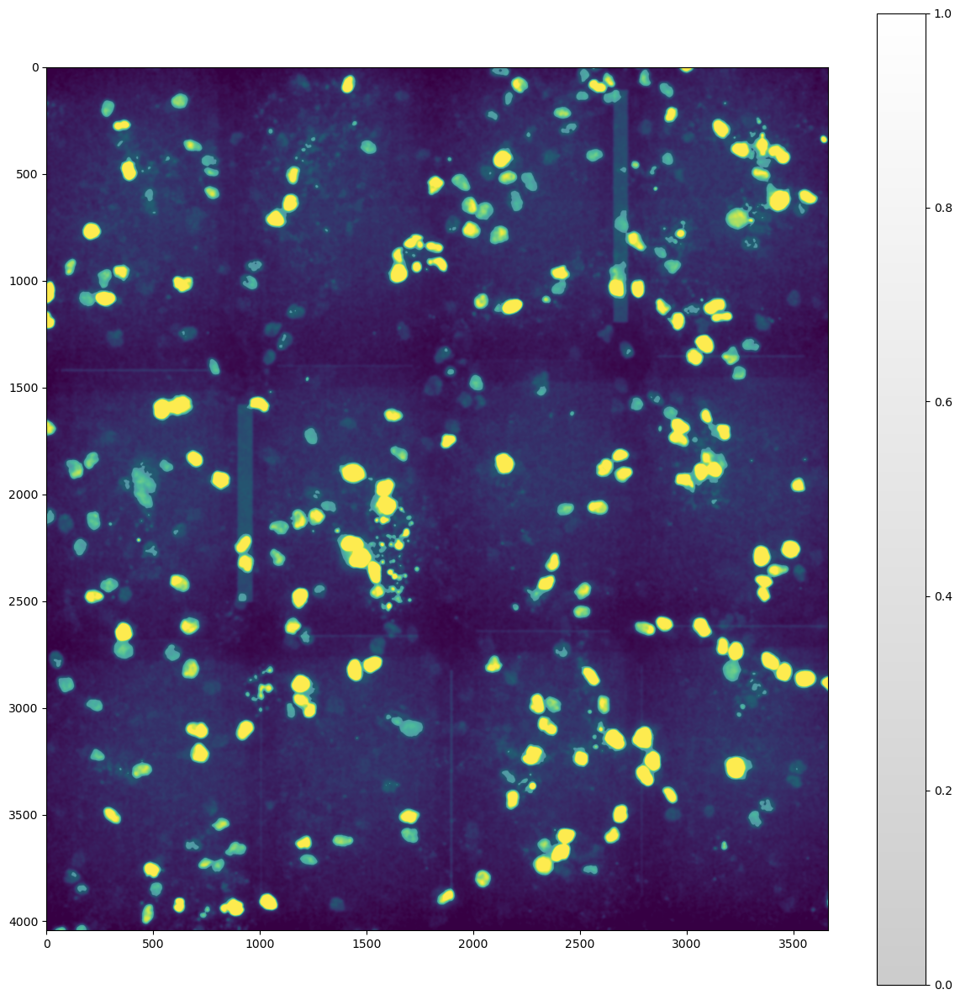

In [152]:
plt.figure(figsize=(15,15))
plt.imshow(gem_normalized[13])
plt.imshow(gem_normalized[13]>0.4, cmap='gray', alpha=0.2)
plt.colorbar()

In [110]:
color=np.stack([gem_blurred, pip_blurred, np.zeros_like(pip_blurred)], axis=-1)

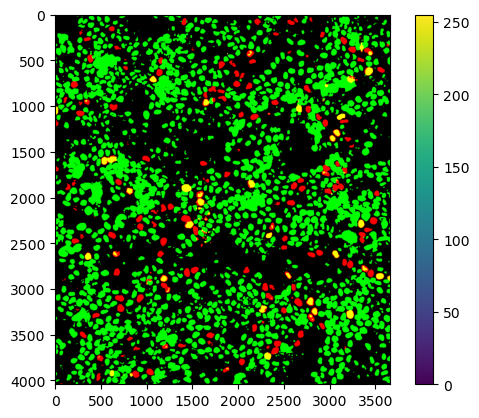

In [115]:
plt.imshow((color[13]>101).astype(int)*255)
plt.colorbar()

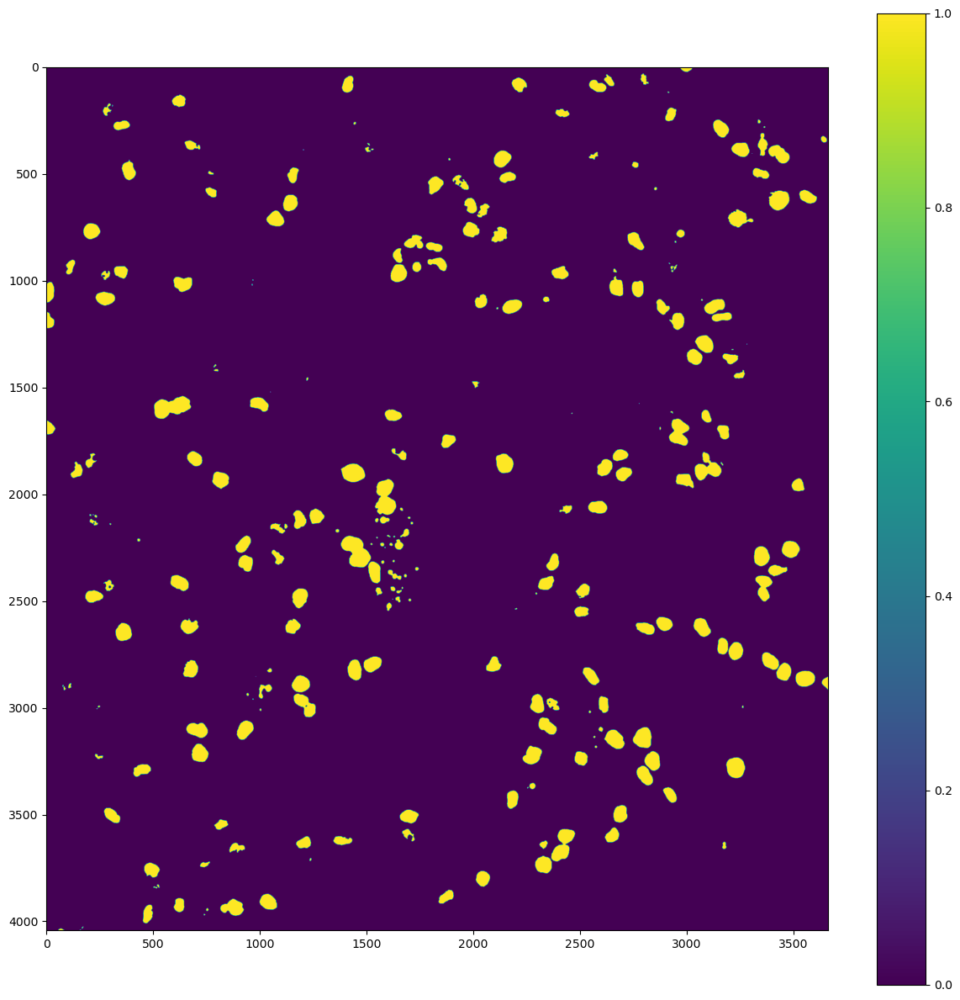

In [95]:
plt.figure(figsize=(15,15))
plt.imshow(gem_blurred[13]>101)
plt.colorbar()